In [1]:
import torch
import torch.nn.functional as F
from torch.utils.data import Dataset
import pytorch_lightning as pl
import segmentation_models_pytorch as smp
from datasets import load_dataset
from torch.utils.data import random_split
from torchvision.transforms import v2
from collections import defaultdict
import pandas as pd
import matplotlib.pyplot as plt
import os
import random
import numpy as np
import cv2
import glob
from PIL import Image

In [2]:
ds = load_dataset("urbanstevie/reference_dataset")


Repo card metadata block was not found. Setting CardData to empty.


In [3]:
from utilities import set_seed
set_seed(42)

42

## Sprinkles method got from:
[Here](https://github.com/jcgy/sprinkles)

In [4]:
def sprinkles(
    img,
    size,
    perc,
    channels=3,
    mode="random",
    width=2,
    pattern_path="fence_pattern.png",
    mask_dataset_path="dataset/Training Set/Training_Labels",
    dilation_kernel_size=3
):
    """
    img: torch.Tensor of shape (C, H, W), values in [0, 1]
    mode: "random" | "grid" | "diagonals" | "pattern" | "dataset_mask"
    size:
        - random: sprinkle square size
        - grid/diagonals: spacing between lines
        - pattern/dataset_mask: ignored
    perc:
        - random: percentage of pixels to affect
        - grid/diagonals/pattern/dataset_mask: ignored (kept for API consistency)
    width: line thickness for grid/diagonals
    pattern_path: path to the fence pattern image (for mode="pattern")
    mask_dataset_path: path to the mask dataset folder (for mode="dataset_mask")
    dilation_kernel_size: kernel size for morphological dilation (for mode="dataset_mask")
    """
    x = img.clone()
    C, H, W = x.shape
    mask = torch.zeros((1, H, W), dtype=torch.float32)
    
    # RANDOM (original behavior)
    if mode == "random":
        number_of_pixels_to_change = int(perc * H * W)
        number_of_sprinkles = max(1, number_of_pixels_to_change // (size * size))
        for _ in range(number_of_sprinkles):
            y = torch.randint(0, H - size, (1,)).item()
            x0 = torch.randint(0, W - size, (1,)).item()
            x[:, y:y + size, x0:x0 + size] = 0.0
            mask[:, y:y + size, x0:x0 + size] = 1.0
    
    # GRID (vertical + horizontal lines)
    elif mode == "grid":
        for y in range(0, H, size):
            y_end = min(y + width, H)
            x[:, y:y_end, :] = 0.0
            mask[:, y:y_end, :] = 1.0
        for x0 in range(0, W, size):
            x_end = min(x0 + width, W)
            x[:, :, x0:x_end] = 0.0
            mask[:, :, x0:x_end] = 1.0
    
    # DIAGONALS (both directions)
    elif mode == "diagonals":
        for offset in range(-H, W, size):
            for w in range(width):
                # main diagonal \
                y = torch.arange(H)
                x_diag = y + offset + w
                valid = (x_diag >= 0) & (x_diag < W)
                x[:, y[valid], x_diag[valid]] = 0.0
                mask[:, y[valid], x_diag[valid]] = 1.0
                # anti-diagonal /
                x_anti = (W - 1 - y) + offset + w
                valid = (x_anti >= 0) & (x_anti < W)
                x[:, y[valid], x_anti[valid]] = 0.0
                mask[:, y[valid], x_anti[valid]] = 1.0
    
    # PATTERN (load from image file)
    elif mode == "pattern":
        # Load the pattern image
        if not os.path.exists(pattern_path):
            raise FileNotFoundError(f"Pattern image not found: {pattern_path}")
        
        pattern_img = Image.open(pattern_path).convert("L")  # Convert to grayscale
        pattern_img = pattern_img.resize((W, H), Image.NEAREST)  # Resize to match image
        
        # Convert to tensor and normalize
        pattern_array = np.array(pattern_img, dtype=np.float32) / 255.0
        pattern_tensor = torch.from_numpy(pattern_array).unsqueeze(0)  # [1, H, W]
        
        # Binarize the pattern (threshold at 0.5)
        mask = (pattern_tensor > 0.5).float()
        
        # Apply mask to image (zero out where mask is 1)
        x = x * (1 - mask)
    
    # DATASET_MASK (load random mask from dataset)
    elif mode == "dataset_mask":
        # Get all mask files from the dataset
        if not os.path.exists(mask_dataset_path):
            raise FileNotFoundError(f"Mask dataset path not found: {mask_dataset_path}")
        
        mask_files = glob.glob(os.path.join(mask_dataset_path, "*.png")) + \
                     glob.glob(os.path.join(mask_dataset_path, "*.jpg")) + \
                     glob.glob(os.path.join(mask_dataset_path, "*.jpeg"))
        
        if len(mask_files) == 0:
            raise FileNotFoundError(f"No mask images found in: {mask_dataset_path}")
        
        # Randomly select a mask file
        random_mask_path = np.random.choice(mask_files)
        
        # Load the mask image
        mask_img = Image.open(random_mask_path).convert("L")  # Convert to grayscale
        mask_array = np.array(mask_img, dtype=np.float32) / 255.0
        
        # Get mask dimensions
        mask_h, mask_w = mask_array.shape
        
        # Strategy: Random crop or resize based on relative sizes
        
        mask_img_resized = mask_img.resize((W, H), Image.BILINEAR)
        mask_array = np.array(mask_img_resized, dtype=np.float32) / 255.0
        
        # Apply dilation to thicken the mask lines
        if dilation_kernel_size > 0:
            kernel = cv2.getStructuringElement(
                cv2.MORPH_ELLIPSE, 
                (dilation_kernel_size, dilation_kernel_size)
            )
            mask_array = cv2.dilate(mask_array, kernel, iterations=1)
        
        # Convert to tensor
        mask_tensor = torch.from_numpy(mask_array).unsqueeze(0)  # [1, H, W]
        
        # Binarize the mask (threshold at 0.5)
        mask = (mask_tensor > 0.5).float()
        
        # Apply mask to image (zero out where mask is 1)
        x = x * (1 - mask)
    
    else:
        raise ValueError(f"Unknown mode: {mode}")
    
    return x, img, mask

In [ ]:
class HFImageDataset(Dataset):
    def __init__(self, hf_dataset, transforms=None, sprinkles_mode='mixed',
                 mask_dataset_path="dataset/Training Set/Training_Labels",
                 dilation_kernel_size=3):
        self.dataset = hf_dataset
        self.transforms = transforms
        self.sprinkles_mode = sprinkles_mode
        self.mask_dataset_path = mask_dataset_path
        self.dilation_kernel_size = dilation_kernel_size
        
        # Available augmentation modes
        self.available_modes = ['random', 'grid', 'diagonals', 'pattern', 'dataset_mask']
    
    def __len__(self):
        return len(self.dataset)
    
    def __getitem__(self, idx):
        item = self.dataset[idx]
        image = item['image']  # PIL Image
        
        if self.transforms:
            image = self.transforms(image)
        
        # Randomly select a sprinkle mode for this image
        if self.sprinkles_mode == 'mixed':
            selected_mode = np.random.choice(self.available_modes)
        else:
            selected_mode = self.sprinkles_mode
        
        # Create masked version with the selected mode
        masked_image, original_image, mask = sprinkles(
            image, 
            size=10, 
            perc=0.15, 
            mode=selected_mode,
            mask_dataset_path=self.mask_dataset_path,
            dilation_kernel_size=self.dilation_kernel_size
        )
        
        return {
            'masked_image': masked_image,  # X - input to U-Net
            'original_image': original_image,  # Y - target for U-Net
            'mask': mask  # Optional: can be used for masked loss
        }


# DataModule
class DataModule(pl.LightningDataModule):
    def __init__(self, dataset_name, bs, train_split=0.70, val_split=0.15, 
                 test_split=0.15, num_workers=4, sprinkles_mode='mixed',
                 mask_dataset_path="dataset/Training Set/Training_Labels",
                 dilation_kernel_size=3):
        super().__init__()
        self.dataset_name = dataset_name
        self.bs = bs
        self.train_split = train_split
        self.val_split = val_split
        self.test_split = test_split
        self.num_workers = num_workers
        self.sprinkles_mode = sprinkles_mode
        self.mask_dataset_path = mask_dataset_path
        self.dilation_kernel_size = dilation_kernel_size
    
    def setup(self, stage=None):
        from datasets import load_dataset
        from torch.utils.data import random_split
        from torchvision.transforms import v2
        
        # Load dataset
        ds = load_dataset(self.dataset_name)
        
        # If dataset has splits, use them
        if 'train' in ds and 'test' in ds:
            full_train = ds['train']
            self.test_data = ds['test']
            
            # Split train into train/val
            train_size = int(self.train_split / (self.train_split + self.val_split) * len(full_train))
            val_size = len(full_train) - train_size
            train_data, val_data = random_split(full_train, [train_size, val_size])
            
        else:
            # No predefined splits, create our own
            full_dataset = ds['train'] if 'train' in ds else ds[list(ds.keys())[0]]
            total_size = len(full_dataset)
            train_size = int(self.train_split * total_size)
            val_size = int(self.val_split * total_size)
            test_size = total_size - train_size - val_size
            
            train_data, val_data, test_data = random_split(
                full_dataset, 
                [train_size, val_size, test_size]
            )
            self.test_data = test_data
        
        # Define transforms
        rgb_transforms = v2.Compose([
            v2.ToImage(), 
            v2.Resize(256),
            v2.CenterCrop(224),
            v2.ToDtype(torch.float32, scale=True),
            v2.Normalize(
                mean=[0.34437724, 0.38029198, 0.40777111], 
                std=[0.20265734, 0.13689059, 0.11554374]
            )
        ])
        
        # Create datasets with mixed augmentations
        self.train_ds = HFImageDataset(
            train_data, 
            transforms=rgb_transforms,
            sprinkles_mode=self.sprinkles_mode,
            mask_dataset_path=self.mask_dataset_path,
            dilation_kernel_size=self.dilation_kernel_size
        )
        self.valid_ds = HFImageDataset(
            val_data, 
            transforms=rgb_transforms,
            sprinkles_mode=self.sprinkles_mode,
            mask_dataset_path=self.mask_dataset_path,
            dilation_kernel_size=self.dilation_kernel_size
        )
        self.test_ds = HFImageDataset(
            test_data, 
            transforms=rgb_transforms,
            sprinkles_mode=self.sprinkles_mode,
            mask_dataset_path=self.mask_dataset_path,
            dilation_kernel_size=self.dilation_kernel_size
        )
    
    def train_dataloader(self):
        return torch.utils.data.DataLoader(
            self.train_ds, 
            batch_size=self.bs, 
            shuffle=True, 
            num_workers=self.num_workers
        )
    
    def val_dataloader(self):
        return torch.utils.data.DataLoader(
            self.valid_ds, 
            batch_size=self.bs, 
            shuffle=False, 
            num_workers=self.num_workers
        )
    
    def test_dataloader(self):
        return torch.utils.data.DataLoader(
            self.test_ds, 
            batch_size=self.bs, 
            shuffle=False, 
            num_workers=self.num_workers
        )

Repo card metadata block was not found. Setting CardData to empty.
Repo card metadata block was not found. Setting CardData to empty.


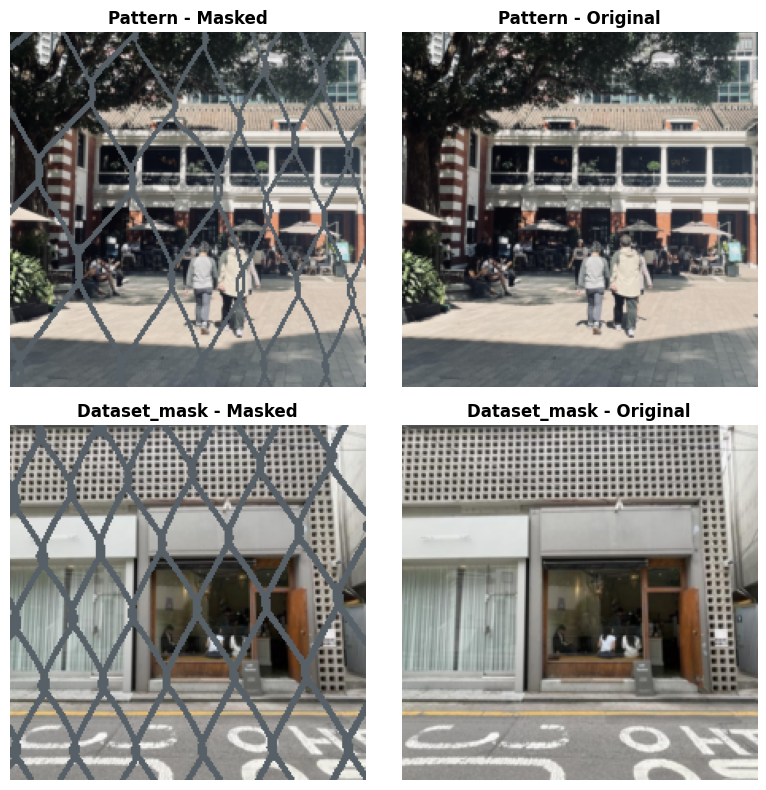

Visualization saved to 'all_sprinkle_patterns.png'
Patterns shown: pattern, dataset_mask


In [6]:
# List of all sprinkle modes
sprinkle_modes = ["pattern", "dataset_mask"]

# Denormalization parameters
mean = torch.tensor([0.34437724, 0.38029198, 0.40777111]).view(3, 1, 1)
std = torch.tensor([0.20265734, 0.13689059, 0.11554374]).view(3, 1, 1)

# Create figure with subplots for all modes
fig, axes = plt.subplots(len(sprinkle_modes), 2, figsize=(8, 4*len(sprinkle_modes)))

for mode_idx, mode in enumerate(sprinkle_modes):
    # Create DataModule with specific sprinkle mode
    dm = DataModule(
        dataset_name="urbanstevie/reference_dataset", 
        bs=32,
        sprinkles_mode=mode
    )
    dm.setup()
    
    # Get one sample
    sample = dm.train_ds[0]
    
    # Get masked and original images
    masked_image = sample['masked_image']
    original_image = sample['original_image']
    
    # Denormalize for visualization
    masked_denorm = masked_image * std + mean
    original_denorm = original_image * std + mean
    
    # Clamp to valid range
    masked_denorm = torch.clamp(masked_denorm, 0, 1)
    original_denorm = torch.clamp(original_denorm, 0, 1)
    
    # Convert to numpy for plotting
    masked_np = masked_denorm.permute(1, 2, 0).numpy()
    original_np = original_denorm.permute(1, 2, 0).numpy()
    
    # Left column: masked images (with cutouts)
    axes[mode_idx, 0].imshow(masked_np)
    axes[mode_idx, 0].axis('off')
    axes[mode_idx, 0].set_title(f'{mode.capitalize()} - Masked', fontsize=12, fontweight='bold')
    
    # Right column: original images (ground truth)
    axes[mode_idx, 1].imshow(original_np)
    axes[mode_idx, 1].axis('off')
    axes[mode_idx, 1].set_title(f'{mode.capitalize()} - Original', fontsize=12, fontweight='bold')

plt.tight_layout()
plt.savefig('all_sprinkle_patterns.png', dpi=150, bbox_inches='tight')
plt.show()

print(f"Visualization saved to 'all_sprinkle_patterns.png'")
print(f"Patterns shown: {', '.join(sprinkle_modes)}")

In [ ]:
class LightningModule(pl.LightningModule):
    def __init__(self, learning_rate=1e-3):
        super().__init__()
        self.save_hyperparameters()
        
        # Creating model
        self.model = smp.Unet(
            encoder_name='resnet50',
            encoder_weights='imagenet',
            in_channels=4,
            classes=3  # rgb 
        )
        self.training_step_outputs = defaultdict(float)
        self.validation_step_outputs = defaultdict(float)
        
    def forward(self, x):
        return self.model(x)
    
    def configure_optimizers(self):
        optimizer = torch.optim.Adam(self.parameters(), lr=self.hparams.learning_rate)
        
        # Add learning rate scheduler
        scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
            optimizer, 
            mode='min',
            factor=0.5,           # Reduce LR by 50%
            patience=5,           # Wait 5 epochs before reducing
            min_lr=1e-6,          # Don't go below this
        )
        
        return {
            "optimizer": optimizer,
            "lr_scheduler": {
                "scheduler": scheduler,
                "monitor": "val_loss",
                "interval": "epoch",
                "frequency": 1
            }
        }
    
    def training_step(self, batch, batch_idx):
        x_simple = batch['masked_image']
        y = batch['original_image']
        mask = batch['mask']
        
        # Ensure mask has channel dimension
        if mask.dim() == 3:
            mask = mask.unsqueeze(1)  # [B, H, W] -> [B, 1, H, W]
        
        # Concatenate along channel dimension
        x = torch.cat([x_simple, mask], dim=1)  # Shape: [B, 4, H, W]
        y_hat = self(x)
        
        # Use L1 loss
        loss = F.l1_loss(y_hat, y)
        
        self.log('train_loss', loss, on_step=False, on_epoch=True, prog_bar=True)
        self.training_step_outputs['loss'] += loss.detach().cpu()
        self.training_step_outputs['steps'] += 1
        
        return loss
    
    def validation_step(self, batch, batch_idx):
        x_simple = batch['masked_image']
        y = batch['original_image']
        mask = batch['mask']
        
        if mask.dim() == 3:
            mask = mask.unsqueeze(1)
        
        # Concatenate along channel dimension
        x = torch.cat([x_simple, mask], dim=1)  # Shape: [B, 4, H, W]
        y_hat = self(x)
        
        # Use L1 loss
        loss = F.l1_loss(y_hat, y)
        
        self.log('val_loss', loss, on_step=False, on_epoch=True, prog_bar=True)
        self.validation_step_outputs['loss'] += loss.detach().cpu()
        self.validation_step_outputs['steps'] += 1
        
        return loss
    
    def on_train_epoch_end(self): 
        avg_loss = self.training_step_outputs['loss'] / self.training_step_outputs['steps']
        print(f"Average training loss for epoch {self.current_epoch}: {avg_loss.item():.4f}")
        self.training_step_outputs.clear() 
    
    def on_validation_epoch_end(self):
        avg_loss = self.validation_step_outputs['loss'] / self.validation_step_outputs['steps']
        print(f"Average validation loss for epoch {self.current_epoch}: {avg_loss.item():.4f}")
        self.validation_step_outputs.clear()

In [ ]:
import pytorch_lightning as pl
from pytorch_lightning.callbacks import EarlyStopping, ModelCheckpoint, LearningRateMonitor
from pytorch_lightning.loggers import CSVLogger

# Initialize model
lightning_module = LightningModule(learning_rate=1e-3)

# Logger with augmentation_mix name
csv_logger = CSVLogger(
    save_dir=os.getcwd(), 
    name="augmentation_mix"
)

# Checkpoint callback - save best model
model_checkpoint_callback = ModelCheckpoint(
    monitor='val_loss', 
    mode='min', 
    filename='best_valid_loss-{epoch:02d}-{val_loss:.4f}', 
    verbose=True, 
    save_top_k=3,  # Keep top 3 models
    save_last=True  # Also save last model
)

# Early stopping callback - more patient for 100 epochs
early_stop_callback = EarlyStopping(
    monitor='val_loss',
    min_delta=0.001,      # Minimum change to qualify as improvement
    patience=15,          # Stop after 15 epochs without improvement
    verbose=True,
    mode='min',
    strict=True,          # Crash if monitor metric not found
    check_finite=True     # Stop if loss becomes NaN/Inf
)

# Learning rate monitor
lr_monitor = LearningRateMonitor(logging_interval='epoch')

# Trainer with 100 epochs
trainer = pl.Trainer(
    max_epochs=100,      # Train for 100 epochs
    logger=csv_logger, 
    callbacks=[
        model_checkpoint_callback,
        early_stop_callback,
        lr_monitor
    ],
    gradient_clip_val=1.0,  # Prevent exploding gradients
    log_every_n_steps=5,
    enable_progress_bar=True,
    enable_model_summary=True
)

# Data module with mixed augmentation mode
dm = DataModule(
    dataset_name="urbanstevie/reference_dataset", 
    bs=32,
    sprinkles_mode="mixed",  # Use mixed mode for random augmentation selection
    mask_dataset_path="dataset/Training Set/Training_Labels",
    dilation_kernel_size=5
)
dm.setup()

# Train
print("\n" + "="*60)
print("Starting training with MIXED AUGMENTATION MODE")
print("Available augmentations: random, grid, diagonals, pattern, dataset_mask")
print("Training for 100 epochs")
print("="*60 + "\n")

trainer.fit(lightning_module, dm)

print(f"\n✓ Training completed!")
print(f"  Best model saved to: {model_checkpoint_callback.best_model_path}")
print(f"  Best validation loss: {model_checkpoint_callback.best_model_score:.4f}")

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
Repo card metadata block was not found. Setting CardData to empty.
You are using a CUDA device ('NVIDIA RTX PRO 6000 Blackwell Max-Q Workstation Edition') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
Repo card metadata block was not found. Setting CardData to empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type | Params | Mode 
---------------------------------------
0 | model | Unet | 32.5 M | train
---------------------------------------
32.5 M    Trainable params
0         Non-trainable params
32.5 M    Total params
130.098   Total estimated model params size (MB)
223       Modules in train mode
0

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Average validation loss for epoch 0: 1.5167


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 1.336
Epoch 0, global step 115: 'val_loss' reached 1.33621 (best 1.33621), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/dataset_mask/version_2/checkpoints/best_valid_loss-epoch=00-val_loss=1.3362.ckpt' as top 3


Average validation loss for epoch 0: 1.3220
Average training loss for epoch 0: 0.4779


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 1.017 >= min_delta = 0.001. New best score: 0.319
Epoch 1, global step 230: 'val_loss' reached 0.31908 (best 0.31908), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/dataset_mask/version_2/checkpoints/best_valid_loss-epoch=01-val_loss=0.3191.ckpt' as top 3


Average validation loss for epoch 1: 0.3190
Average training loss for epoch 1: 0.3417


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.005 >= min_delta = 0.001. New best score: 0.314
Epoch 2, global step 345: 'val_loss' reached 0.31418 (best 0.31418), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/dataset_mask/version_2/checkpoints/best_valid_loss-epoch=02-val_loss=0.3142.ckpt' as top 3


Average validation loss for epoch 2: 0.3152
Average training loss for epoch 2: 0.3128


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.038 >= min_delta = 0.001. New best score: 0.276
Epoch 3, global step 460: 'val_loss' reached 0.27623 (best 0.27623), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/dataset_mask/version_2/checkpoints/best_valid_loss-epoch=03-val_loss=0.2762.ckpt' as top 3


Average validation loss for epoch 3: 0.2759
Average training loss for epoch 3: 0.3036


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 4, global step 575: 'val_loss' reached 0.29803 (best 0.27623), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/dataset_mask/version_2/checkpoints/best_valid_loss-epoch=04-val_loss=0.2980.ckpt' as top 3


Average validation loss for epoch 4: 0.2981
Average training loss for epoch 4: 0.2901


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.013 >= min_delta = 0.001. New best score: 0.264
Epoch 5, global step 690: 'val_loss' reached 0.26373 (best 0.26373), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/dataset_mask/version_2/checkpoints/best_valid_loss-epoch=05-val_loss=0.2637.ckpt' as top 3


Average validation loss for epoch 5: 0.2636
Average training loss for epoch 5: 0.2756


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 805: 'val_loss' reached 0.26334 (best 0.26334), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/dataset_mask/version_2/checkpoints/best_valid_loss-epoch=06-val_loss=0.2633.ckpt' as top 3


Average validation loss for epoch 6: 0.2633
Average training loss for epoch 6: 0.2755


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 920: 'val_loss' was not in top 3


Average validation loss for epoch 7: 0.2926
Average training loss for epoch 7: 0.2690


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 1035: 'val_loss' was not in top 3


Average validation loss for epoch 8: 0.2912
Average training loss for epoch 8: 0.2643


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 1150: 'val_loss' was not in top 3


Average validation loss for epoch 9: 0.2787
Average training loss for epoch 9: 0.2523


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.022 >= min_delta = 0.001. New best score: 0.242
Epoch 10, global step 1265: 'val_loss' reached 0.24214 (best 0.24214), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/dataset_mask/version_2/checkpoints/best_valid_loss-epoch=10-val_loss=0.2421.ckpt' as top 3


Average validation loss for epoch 10: 0.2421
Average training loss for epoch 10: 0.2557


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 1380: 'val_loss' reached 0.25409 (best 0.24214), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/dataset_mask/version_2/checkpoints/best_valid_loss-epoch=11-val_loss=0.2541.ckpt' as top 3


Average validation loss for epoch 11: 0.2541
Average training loss for epoch 11: 0.2469


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 1495: 'val_loss' reached 0.25037 (best 0.24214), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/dataset_mask/version_2/checkpoints/best_valid_loss-epoch=12-val_loss=0.2504.ckpt' as top 3


Average validation loss for epoch 12: 0.2500
Average training loss for epoch 12: 0.2522


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.019 >= min_delta = 0.001. New best score: 0.223
Epoch 13, global step 1610: 'val_loss' reached 0.22270 (best 0.22270), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/dataset_mask/version_2/checkpoints/best_valid_loss-epoch=13-val_loss=0.2227.ckpt' as top 3


Average validation loss for epoch 13: 0.2226
Average training loss for epoch 13: 0.2458


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 1725: 'val_loss' reached 0.23403 (best 0.22270), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/dataset_mask/version_2/checkpoints/best_valid_loss-epoch=14-val_loss=0.2340.ckpt' as top 3


Average validation loss for epoch 14: 0.2339
Average training loss for epoch 14: 0.2438


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.001 >= min_delta = 0.001. New best score: 0.221
Epoch 15, global step 1840: 'val_loss' reached 0.22142 (best 0.22142), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/dataset_mask/version_2/checkpoints/best_valid_loss-epoch=15-val_loss=0.2214.ckpt' as top 3


Average validation loss for epoch 15: 0.2220
Average training loss for epoch 15: 0.2373


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 1955: 'val_loss' reached 0.22708 (best 0.22142), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/dataset_mask/version_2/checkpoints/best_valid_loss-epoch=16-val_loss=0.2271.ckpt' as top 3


Average validation loss for epoch 16: 0.2270
Average training loss for epoch 16: 0.2401


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 2070: 'val_loss' reached 0.22203 (best 0.22142), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/dataset_mask/version_2/checkpoints/best_valid_loss-epoch=17-val_loss=0.2220.ckpt' as top 3


Average validation loss for epoch 17: 0.2219
Average training loss for epoch 17: 0.2399


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 2185: 'val_loss' was not in top 3


Average validation loss for epoch 18: 0.2502
Average training loss for epoch 18: 0.2369


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.005 >= min_delta = 0.001. New best score: 0.216
Epoch 19, global step 2300: 'val_loss' reached 0.21598 (best 0.21598), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/dataset_mask/version_2/checkpoints/best_valid_loss-epoch=19-val_loss=0.2160.ckpt' as top 3


Average validation loss for epoch 19: 0.2159
Average training loss for epoch 19: 0.2360


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.002 >= min_delta = 0.001. New best score: 0.214
Epoch 20, global step 2415: 'val_loss' reached 0.21441 (best 0.21441), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/dataset_mask/version_2/checkpoints/best_valid_loss-epoch=20-val_loss=0.2144.ckpt' as top 3


Average validation loss for epoch 20: 0.2143
Average training loss for epoch 20: 0.2350


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 2530: 'val_loss' was not in top 3


Average validation loss for epoch 21: 0.2266
Average training loss for epoch 21: 0.2290


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 22, global step 2645: 'val_loss' was not in top 3


Average validation loss for epoch 22: 0.2238
Average training loss for epoch 22: 0.2342


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 23, global step 2760: 'val_loss' reached 0.21715 (best 0.21441), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/dataset_mask/version_2/checkpoints/best_valid_loss-epoch=23-val_loss=0.2172.ckpt' as top 3


Average validation loss for epoch 23: 0.2170
Average training loss for epoch 23: 0.2305


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 24, global step 2875: 'val_loss' was not in top 3


Average validation loss for epoch 24: 0.2182
Average training loss for epoch 24: 0.2309


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.012 >= min_delta = 0.001. New best score: 0.203
Epoch 25, global step 2990: 'val_loss' reached 0.20287 (best 0.20287), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/dataset_mask/version_2/checkpoints/best_valid_loss-epoch=25-val_loss=0.2029.ckpt' as top 3


Average validation loss for epoch 25: 0.2028
Average training loss for epoch 25: 0.2206


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 26, global step 3105: 'val_loss' reached 0.20643 (best 0.20287), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/dataset_mask/version_2/checkpoints/best_valid_loss-epoch=26-val_loss=0.2064.ckpt' as top 3


Average validation loss for epoch 26: 0.2063
Average training loss for epoch 26: 0.2220


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 27, global step 3220: 'val_loss' reached 0.21053 (best 0.20287), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/dataset_mask/version_2/checkpoints/best_valid_loss-epoch=27-val_loss=0.2105.ckpt' as top 3


Average validation loss for epoch 27: 0.2105
Average training loss for epoch 27: 0.2208


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 28, global step 3335: 'val_loss' was not in top 3


Average validation loss for epoch 28: 0.2112
Average training loss for epoch 28: 0.2214


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 29, global step 3450: 'val_loss' reached 0.20308 (best 0.20287), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/dataset_mask/version_2/checkpoints/best_valid_loss-epoch=29-val_loss=0.2031.ckpt' as top 3


Average validation loss for epoch 29: 0.2030
Average training loss for epoch 29: 0.2169


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.005 >= min_delta = 0.001. New best score: 0.198
Epoch 30, global step 3565: 'val_loss' reached 0.19808 (best 0.19808), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/dataset_mask/version_2/checkpoints/best_valid_loss-epoch=30-val_loss=0.1981.ckpt' as top 3


Average validation loss for epoch 30: 0.1979
Average training loss for epoch 30: 0.2149


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.009 >= min_delta = 0.001. New best score: 0.189
Epoch 31, global step 3680: 'val_loss' reached 0.18909 (best 0.18909), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/dataset_mask/version_2/checkpoints/best_valid_loss-epoch=31-val_loss=0.1891.ckpt' as top 3


Average validation loss for epoch 31: 0.1890
Average training loss for epoch 31: 0.2116


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 32, global step 3795: 'val_loss' reached 0.19673 (best 0.18909), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/dataset_mask/version_2/checkpoints/best_valid_loss-epoch=32-val_loss=0.1967.ckpt' as top 3


Average validation loss for epoch 32: 0.1965
Average training loss for epoch 32: 0.2109


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 33, global step 3910: 'val_loss' reached 0.19311 (best 0.18909), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/dataset_mask/version_2/checkpoints/best_valid_loss-epoch=33-val_loss=0.1931.ckpt' as top 3


Average validation loss for epoch 33: 0.1930
Average training loss for epoch 33: 0.2116


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 34, global step 4025: 'val_loss' reached 0.19329 (best 0.18909), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/dataset_mask/version_2/checkpoints/best_valid_loss-epoch=34-val_loss=0.1933.ckpt' as top 3


Average validation loss for epoch 34: 0.1934
Average training loss for epoch 34: 0.2091


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.002 >= min_delta = 0.001. New best score: 0.187
Epoch 35, global step 4140: 'val_loss' reached 0.18720 (best 0.18720), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/dataset_mask/version_2/checkpoints/best_valid_loss-epoch=35-val_loss=0.1872.ckpt' as top 3


Average validation loss for epoch 35: 0.1876
Average training loss for epoch 35: 0.2115


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 36, global step 4255: 'val_loss' was not in top 3


Average validation loss for epoch 36: 0.1977
Average training loss for epoch 36: 0.2098


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 37, global step 4370: 'val_loss' reached 0.18749 (best 0.18720), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/dataset_mask/version_2/checkpoints/best_valid_loss-epoch=37-val_loss=0.1875.ckpt' as top 3


Average validation loss for epoch 37: 0.1876
Average training loss for epoch 37: 0.2036


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 38, global step 4485: 'val_loss' was not in top 3


Average validation loss for epoch 38: 0.1972
Average training loss for epoch 38: 0.2056


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 39, global step 4600: 'val_loss' was not in top 3


Average validation loss for epoch 39: 0.1993
Average training loss for epoch 39: 0.2146


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.003 >= min_delta = 0.001. New best score: 0.184
Epoch 40, global step 4715: 'val_loss' reached 0.18417 (best 0.18417), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/dataset_mask/version_2/checkpoints/best_valid_loss-epoch=40-val_loss=0.1842.ckpt' as top 3


Average validation loss for epoch 40: 0.1842
Average training loss for epoch 40: 0.2041


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 41, global step 4830: 'val_loss' was not in top 3


Average validation loss for epoch 41: 0.1916
Average training loss for epoch 41: 0.2083


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 42, global step 4945: 'val_loss' reached 0.18463 (best 0.18417), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/dataset_mask/version_2/checkpoints/best_valid_loss-epoch=42-val_loss=0.1846.ckpt' as top 3


Average validation loss for epoch 42: 0.1846
Average training loss for epoch 42: 0.2066


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 43, global step 5060: 'val_loss' was not in top 3


Average validation loss for epoch 43: 0.1964
Average training loss for epoch 43: 0.2078


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.002 >= min_delta = 0.001. New best score: 0.182
Epoch 44, global step 5175: 'val_loss' reached 0.18248 (best 0.18248), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/dataset_mask/version_2/checkpoints/best_valid_loss-epoch=44-val_loss=0.1825.ckpt' as top 3


Average validation loss for epoch 44: 0.1825
Average training loss for epoch 44: 0.2026


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 45, global step 5290: 'val_loss' reached 0.18298 (best 0.18248), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/dataset_mask/version_2/checkpoints/best_valid_loss-epoch=45-val_loss=0.1830.ckpt' as top 3


Average validation loss for epoch 45: 0.1831
Average training loss for epoch 45: 0.2050


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 46, global step 5405: 'val_loss' reached 0.18180 (best 0.18180), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/dataset_mask/version_2/checkpoints/best_valid_loss-epoch=46-val_loss=0.1818.ckpt' as top 3


Average validation loss for epoch 46: 0.1819
Average training loss for epoch 46: 0.2025


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 47, global step 5520: 'val_loss' was not in top 3


Average validation loss for epoch 47: 0.1862
Average training loss for epoch 47: 0.2004


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 48, global step 5635: 'val_loss' was not in top 3


Average validation loss for epoch 48: 0.1913
Average training loss for epoch 48: 0.2016


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 49, global step 5750: 'val_loss' was not in top 3


Average validation loss for epoch 49: 0.1833
Average training loss for epoch 49: 0.2005


`Trainer.fit` stopped: `max_epochs=50` reached.



✓ Training completed!
  Best model saved to: /home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/dataset_mask/version_2/checkpoints/best_valid_loss-epoch=46-val_loss=0.1818.ckpt
  Best validation loss: 0.1818


   epoch  lr-Adam  step  train_loss  val_loss
0    0.0      NaN   114    0.478050  1.336215
1    1.0      NaN   229    0.340838  0.319079
2    2.0      NaN   344    0.312651  0.314176
3    3.0      NaN   459    0.298922  0.276228
4    4.0      NaN   574    0.288620  0.298033


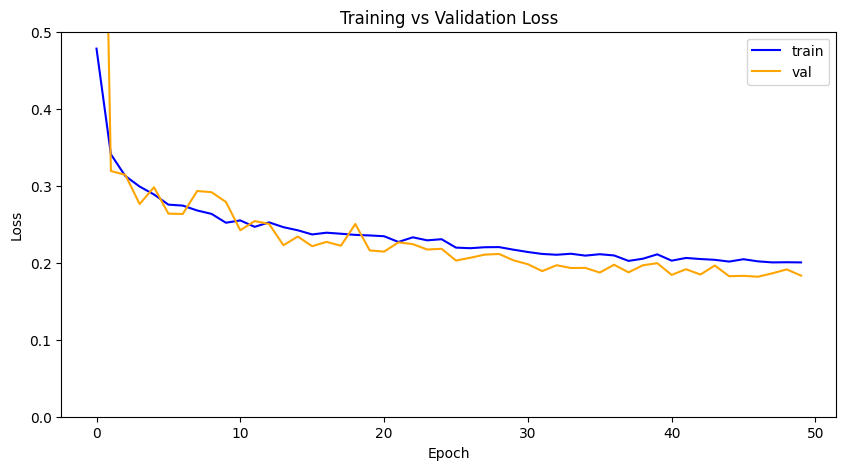

In [10]:
metric_df = pd.read_csv('dataset_mask/version_2/metrics.csv')
metric_df = metric_df.groupby('epoch', as_index=False).first()
print(metric_df.head())

f, ax = plt.subplots(1, 1, figsize=(10, 5))
metric_df.train_loss.plot(ax=ax, color='blue', label='train')
metric_df.val_loss.plot(ax=ax, color='orange', label='val')

ax.set_xlabel('Epoch')
ax.set_ylabel('Loss')
ax.set_ylim([0,0.5]) 
ax.set_title('Training vs Validation Loss')
ax.legend()
plt.show()



In [11]:
# Load the best model
model = LightningModule.load_from_checkpoint(model_checkpoint_callback.best_model_path)
model.cuda(0) # Move to GPU
model.eval()

LightningModule(
  (model): Unet(
    (encoder): ResNetEncoder(
      (conv1): Conv2d(4, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (relu): ReL

In [12]:
def denormalize(img, mean, std):
    """Denormalize image for visualization"""
    img = img.clone()
    for i in range(3):
        img[i] = img[i] * std[i] + mean[i]
    return img.clamp(0, 1)

def visualize_inpainting(model, dataloader, device='cuda', num_images=4):
    """
    Visualize inpainting results
    
    Args:
        model: Trained PyTorch Lightning model
        dataloader: DataLoader with test/validation data
        device: 'cuda' or 'cpu'
        num_images: Number of images to visualize
    """
    model.eval()
    model.to(device)
    
    # Get normalization parameters (adjust these to match your DataModule)
    mean = [0.34437724, 0.38029198, 0.40777111]
    std = [0.20265734, 0.13689059, 0.11554374]
    
    # Get a batch
    batch = next(iter(dataloader))
    masked_images = batch['masked_image'][:num_images].to(device)
    original_images = batch['original_image'][:num_images].to(device)
    masks = batch['mask'][:num_images].to(device)
    
    # Ensure mask has channel dimension
    if masks.dim() == 3:
        masks = masks.unsqueeze(1)  # [B, H, W] -> [B, 1, H, W]
    
    # Concatenate masked images with mask to create 4-channel input
    input_images = torch.cat([masked_images, masks], dim=1)  # [B, 4, H, W]
    
    # Get predictions
    with torch.no_grad():
        predicted_images = model(input_images)
    
    # Move to CPU for visualization
    masked_images = masked_images.cpu()
    original_images = original_images.cpu()
    predicted_images = predicted_images.cpu()
    masks = masks.cpu()
    
    # Create figure with 5 columns
    fig, axes = plt.subplots(num_images, 5, figsize=(20, 4*num_images))
    
    for i in range(num_images):
        # Denormalize images
        masked_img = denormalize(masked_images[i], mean, std)
        original_img = denormalize(original_images[i], mean, std)
        predicted_img = denormalize(predicted_images[i], mean, std)
        
        # Calculate absolute difference (error map)
        diff = torch.abs(predicted_img - original_img)
        # Convert to grayscale for difference visualization (mean across RGB channels)
        diff_gray = diff.mean(dim=0).numpy()
        
        # Convert to numpy for plotting (C, H, W) -> (H, W, C)
        masked_np = masked_img.permute(1, 2, 0).numpy()
        original_np = original_img.permute(1, 2, 0).numpy()
        predicted_np = predicted_img.permute(1, 2, 0).numpy()
        mask_np = masks[i, 0].numpy()  # Single channel mask
        
        # Plot
        axes[i, 0].imshow(masked_np)
        axes[i, 0].set_title('Masked Input', fontsize=12, fontweight='bold')
        axes[i, 0].axis('off')
        
        axes[i, 1].imshow(mask_np, cmap='gray')
        axes[i, 1].set_title('Mask', fontsize=12, fontweight='bold')
        axes[i, 1].axis('off')
        
        axes[i, 2].imshow(predicted_np)
        axes[i, 2].set_title('Predicted/Reconstructed', fontsize=12, fontweight='bold')
        axes[i, 2].axis('off')
        
        axes[i, 3].imshow(original_np)
        axes[i, 3].set_title('Original/Target', fontsize=12, fontweight='bold')
        axes[i, 3].axis('off')
        
        # Difference map with color gradient
        im = axes[i, 4].imshow(diff_gray, cmap='coolwarm', vmin=0, vmax=1)
        axes[i, 4].set_title('Difference Map', fontsize=12, fontweight='bold')
        axes[i, 4].axis('off')
        
        # Add colorbar to the last row
        if i == num_images - 1:
            cbar = plt.colorbar(im, ax=axes[i, 4], fraction=0.046, pad=0.04)
            cbar.set_label('Error Magnitude', rotation=270, labelpad=15)
    
    plt.tight_layout()
    plt.savefig('inpainting_results.png', dpi=150, bbox_inches='tight')
    plt.show()
    
    print(f"Results saved to 'inpainting_results.png'")


Visualizing results for: DATASET_MASK mode



Repo card metadata block was not found. Setting CardData to empty.


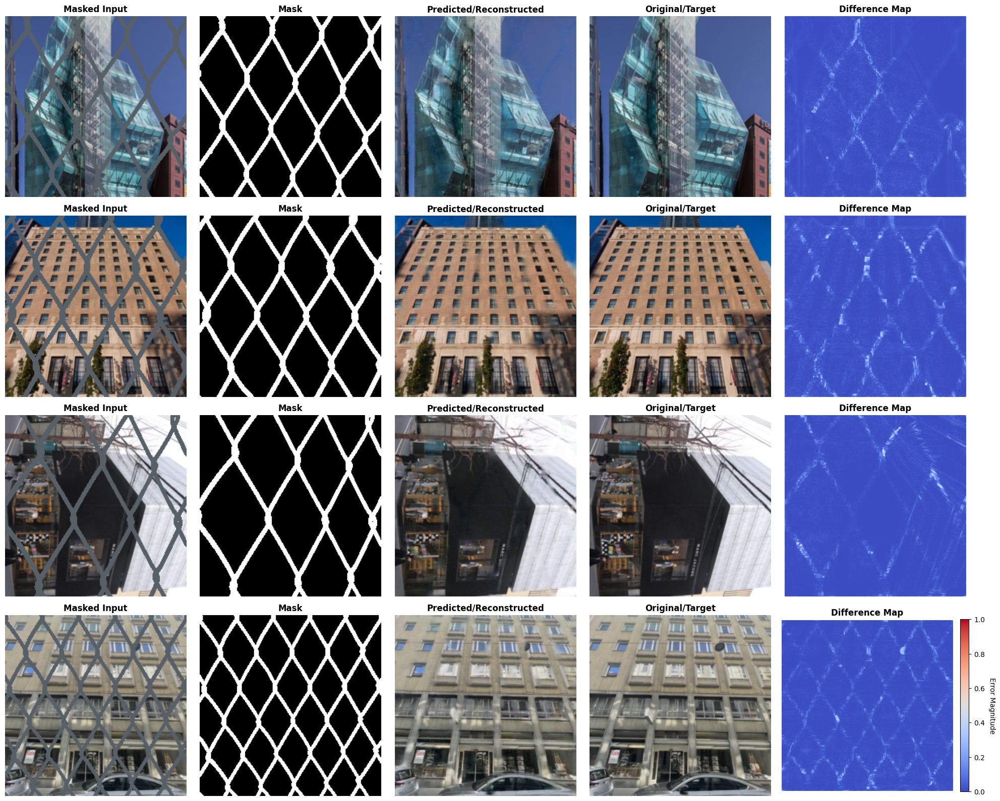

Results saved to 'inpainting_results.png'
✓ Completed visualization for dataset_mask mode

All visualizations complete!


In [13]:
import torch

sprinkle_modes = ["dataset_mask"]
device = 'cuda' if torch.cuda.is_available() else 'cpu'

for mode in sprinkle_modes:
    print(f"\n{'='*60}")
    print(f"Visualizing results for: {mode.upper()} mode")
    print(f"{'='*60}\n")
    
    # Load model checkpoint for this mode
    checkpoint_path = f'{mode}/version_2/checkpoints/best_valid_loss-epoch=46-val_loss=0.1818.ckpt'
    model = LightningModule.load_from_checkpoint(checkpoint_path)
    
    # Load data with the same sprinkle mode used for training
    data_module = DataModule(
        dataset_name='urbanstevie/reference_dataset', 
        bs=64,
        sprinkles_mode=mode
    )
    data_module.setup()
    
    # Visualize results
    visualize_inpainting(
        model=model,
        dataloader=data_module.test_dataloader(),
        device=device,
        num_images=4
    )
    
    print(f"✓ Completed visualization for {mode} mode\n")

print(f"{'='*60}")
print("All visualizations complete!")
print(f"{'='*60}")

In [14]:
import os
from PIL import Image
import torch
from torch.utils.data import Dataset
import numpy as np
import pytorch_lightning as pl
from torch.utils.data import DataLoader
from torchvision.transforms import v2
from skimage.morphology import dilation

class SegmentationDataset(Dataset):
    def __init__(self, images_dir, labels_dir, spatial_transforms = None, image_transforms = None):
        self.images_dir = images_dir
        self.labels_dir = labels_dir
        self.spatial_transforms = spatial_transforms
        self.image_transforms = image_transforms
        # Only list image files
        self.image_files = sorted(
            [f for f in os.listdir(images_dir) if f.lower().endswith(".jpg")]
        )
    
    def __len__(self):
        return len(self.image_files)
    
    def __getitem__(self, idx):
        img_name = self.image_files[idx]
        base_name = os.path.splitext(img_name)[0]
        img_path = os.path.join(self.images_dir, img_name)
        label_path = os.path.join(self.labels_dir, base_name + ".png")
        
        # Load image and mask
        image = Image.open(img_path).convert("RGB")
        mask = Image.open(label_path).convert("L")  # binary mask
        
        # Apply transforms to image
        if self.spatial_transforms:
            image = self.spatial_transforms(image)
            mask = self.spatial_transforms(mask)
        
        if self.image_transforms:
            image = self.image_transforms(image)

        # Process mask: resize to match image, convert to tensor
        mask = np.array(mask, dtype=np.float32) / 255.0
        mask = dilation(mask)
        mask = torch.from_numpy(mask).unsqueeze(0)  # Add channel dimension [1, H, W]
        
        # Ensure binary mask
        mask = (mask > 0.5).float()
        
        # Create masked image by zeroing out masked regions
        # Invert mask: 1 where we keep, 0 where we mask out
        inverse_mask = 1 - mask
        masked_image = image * inverse_mask
        
        return {
            'masked_image': masked_image,  # Input: image with masked regions zeroed
            'original_image': image,       # Target: original complete image
            'mask': mask                   # Mask: 1 where masked, 0 elsewhere
        }


class SegmentationDataModule(pl.LightningDataModule):
    def __init__(self, data_dir, batch_size=4, num_workers=4):
        super().__init__()
        self.data_dir = data_dir
        self.batch_size = batch_size
        self.num_workers = num_workers
        
        # Define the same transforms used in training
        self.spatial_transforms = v2.Compose([
            v2.Resize(256),
            v2.CenterCrop(224),
        ])

        self.image_transforms = v2.Compose([
            v2.ToImage(),
            v2.ToDtype(torch.float32, scale=True),
            v2.Normalize(
                mean=[0.34437724, 0.38029198, 0.40777111],
                std=[0.20265734, 0.13689059, 0.11554374]
            )
        ])

    
    def setup(self, stage=None):
        self.train_dataset = SegmentationDataset(
            images_dir=os.path.join(self.data_dir, "Training Set", "Training_Images"),
            labels_dir=os.path.join(self.data_dir, "Training Set", "Training_Labels"),
            spatial_transforms=self.spatial_transforms,
            image_transforms = self.image_transforms,
        )
        self.test_dataset = SegmentationDataset(
            images_dir=os.path.join(self.data_dir, "Test Set", "Test_Images"),
            labels_dir=os.path.join(self.data_dir, "Test Set", "Test_Labels"),
            spatial_transforms=self.spatial_transforms,
            image_transforms = self.image_transforms,
        )
    
    def train_dataloader(self):
        return DataLoader(
            self.train_dataset,
            batch_size=self.batch_size,
            shuffle=True,
            num_workers=self.num_workers,
        )
    
    def test_dataloader(self):
        return DataLoader(
            self.test_dataset,
            batch_size=self.batch_size,
            shuffle=False,
            num_workers=self.num_workers,
        )

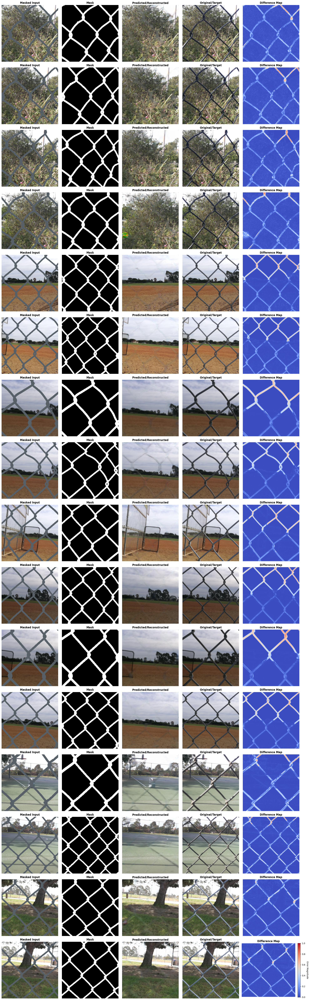

Results saved to 'inpainting_results.png'


In [16]:
# Load the diagonals checkpoint
checkpoint_path = 'dataset_mask//version_2/checkpoints/best_valid_loss-epoch=46-val_loss=0.1818.ckpt'
model = LightningModule.load_from_checkpoint(checkpoint_path)

# Load your segmentation dataset
data_module = SegmentationDataModule(
    data_dir='dataset',
    batch_size=16
)
data_module.setup()

# Visualize results
device = 'cuda' if torch.cuda.is_available() else 'cpu'
visualize_inpainting(
    model=model,
    dataloader=data_module.test_dataloader(),
    device=device,
    num_images=16
)